<a href="https://colab.research.google.com/github/Srinivasan641/Python/blob/main/jupyter_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Required Pakages





In [1]:
import os
import cv2
import glob
import PIL
import shutil
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from skimage import data
from skimage.util import montage
import skimage.transform as skTrans
from skimage.transform import rotate
from skimage.transform import resize
from PIL import Image, ImageOps
import nibabel as nib # Import nibabel

# ml libs
import keras
import keras.backend as K
from keras.callbacks import CSVLogger
import tensorflow as tf
from tensorflow.keras.utils import plot_model
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, TensorBoard

# Corrected import for preprocessing layers
from tensorflow.keras import preprocessing


# Make numpy printouts easier to read.
np.set_printoptions(precision=3, suppress=True)

installing nilearn through pip

In [2]:
!pip install nilearn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.7/12.7 MB 109.6 MB/s eta 0:00:00


image labeling

In [3]:
# DEFINE seg-areas
SEGMENT_CLASSES = {
    0 : 'NOT tumor',
    1 : 'NECROTIC/CORE', # or NON-ENHANCING tumor CORE
    2 : 'EDEMA',
    3 : 'ENHANCING' # original 4 -> converted into 3 later
}

# there are 155 slices per volume
# to start at 5 and use 145 slices means we will skip the first 5 and last 5
VOLUME_SLICES = 100
VOLUME_START_AT = 22 # first slice of volume that we will include

Installing kagglehub

In [4]:
!pip install kagglehub


Importing BraTS2020 Dataset From kaggle

In [5]:
import kagglehub
path = kagglehub.dataset_download("awsaf49/brats20-dataset-training-validation")
print("Dataset path:", path)

Using Colab cache for faster access to the 'brats20-dataset-training-validation' dataset.
Dataset path: /kaggle/input/brats20-dataset-training-validation


Folder Contains Training & Testing dataset

In [6]:
!ls /kaggle/input/brats20-dataset-training-validation

BraTS2020_TrainingData	BraTS2020_ValidationData


inserting the Dataset

Text(0.5, 1.0, 'Mask')

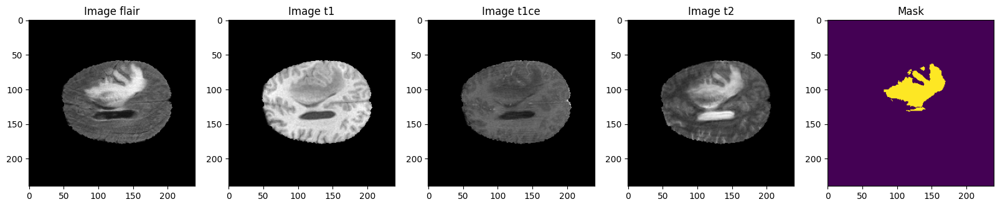

In [7]:
import os
import nibabel as nib
import matplotlib.pyplot as plt

# Ensure 'path' variable is available from previous kagglehub.dataset_download
# Assuming it is: path = '/root/.cache/kagglehub/datasets/awsaf49/brats20-dataset-training-validation/versions/1'

TRAIN_DATASET_PATH = os.path.join(path, 'BraTS2020_TrainingData', 'MICCAI_BraTS2020_TrainingData/')
VALIDATION_DATASET_PATH = os.path.join(path, 'BraTS2020_ValidationData', 'MICCAI_BraTS2020_ValidationData')

test_image_flair=nib.load(TRAIN_DATASET_PATH + 'BraTS20_Training_001/BraTS20_Training_001_flair.nii').get_fdata()
test_image_t1=nib.load(TRAIN_DATASET_PATH + 'BraTS20_Training_001/BraTS20_Training_001_t1.nii').get_fdata()
test_image_t1ce=nib.load(TRAIN_DATASET_PATH + 'BraTS20_Training_001/BraTS20_Training_001_t1ce.nii').get_fdata()
test_image_t2=nib.load(TRAIN_DATASET_PATH + 'BraTS20_Training_001/BraTS20_Training_001_t2.nii').get_fdata()
test_mask=nib.load(TRAIN_DATASET_PATH + 'BraTS20_Training_001/BraTS20_Training_001_seg.nii').get_fdata()


fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1,5, figsize = (20, 10))
slice_w = 25
ax1.imshow(test_image_flair[:,:,test_image_flair.shape[0]//2-slice_w], cmap = 'gray')
ax1.set_title('Image flair')
ax2.imshow(test_image_t1[:,:,test_image_t1.shape[0]//2-slice_w], cmap = 'gray')
ax2.set_title('Image t1')
ax3.imshow(test_image_t1ce[:,:,test_image_t1ce.shape[0]//2-slice_w], cmap = 'gray')
ax3.set_title('Image t1ce')
ax4.imshow(test_image_t2[:,:,test_image_t2.shape[0]//2-slice_w], cmap = 'gray')
ax4.set_title('Image t2')
ax5.imshow(test_mask[:,:,test_mask.shape[0]//2-slice_w])
ax5.set_title('Mask')


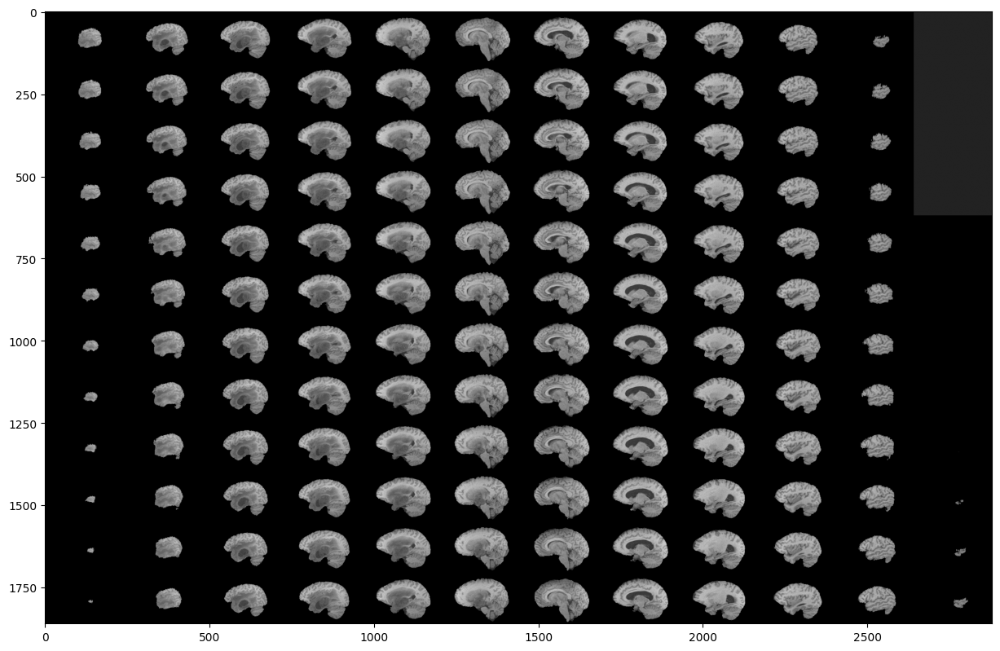

In [8]:
fig, ax1 = plt.subplots(1, 1, figsize = (15,15))
ax1.imshow(rotate(montage(test_image_t1[50:-50,:,:]), 90, resize=True), cmap ='gray')

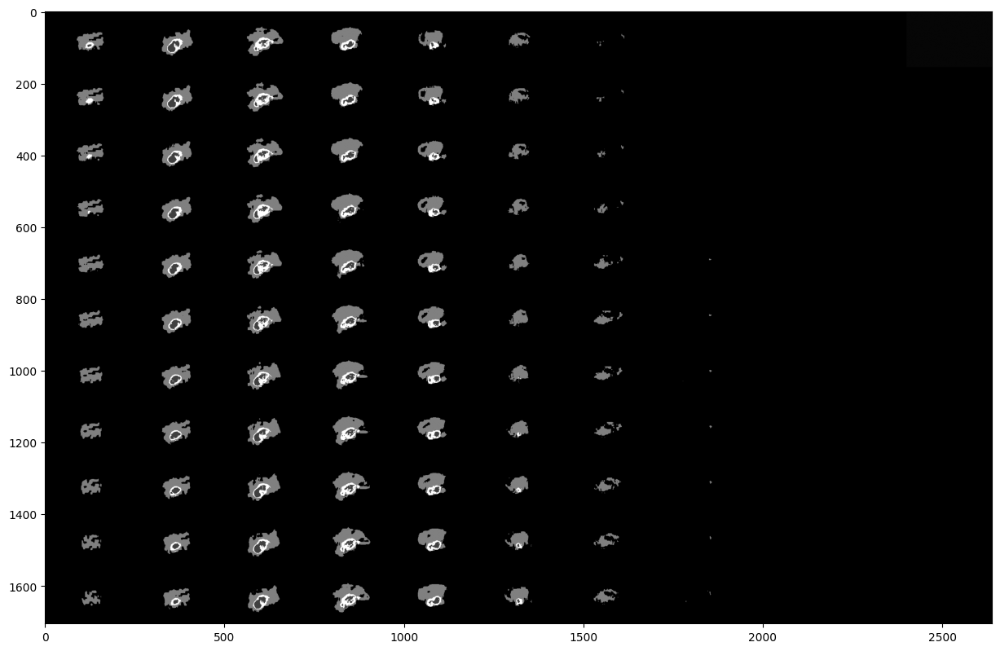

In [9]:
fig, ax1 = plt.subplots(1, 1, figsize = (15,15))
ax1.imshow(rotate(montage(test_mask[60:-60,:,:]), 90, resize=True), cmap ='gray')

#Ground Truth images in the Dataset for training 3dvnet Model
These are expert-annotated labels

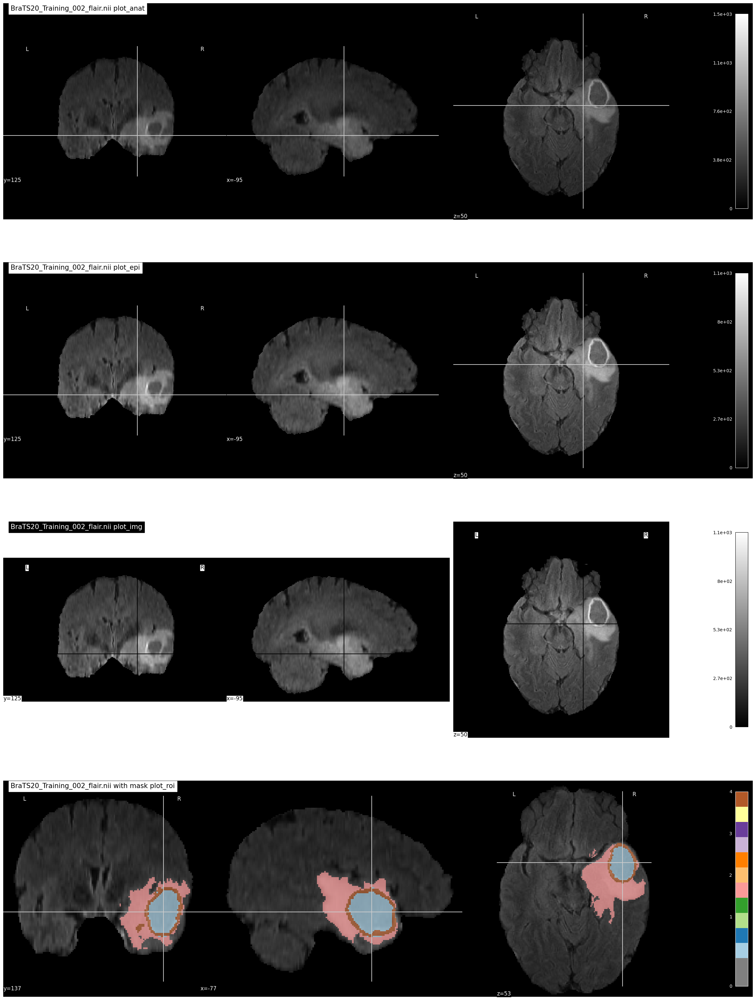

In [10]:
import nilearn.image as image
import nilearn.plotting as plotting

niimg = image.load_img(TRAIN_DATASET_PATH + 'BraTS20_Training_002/BraTS20_Training_002_flair.nii')
nimask = image.load_img(TRAIN_DATASET_PATH + 'BraTS20_Training_002/BraTS20_Training_002_seg.nii')

fig, axes = plt.subplots(nrows=4, figsize=(30, 40))


plotting.plot_anat(niimg,
                title='BraTS20_Training_002_flair.nii plot_anat',
                axes=axes[0])

plotting.plot_epi(niimg,
               title='BraTS20_Training_002_flair.nii plot_epi',
               axes=axes[1])

plotting.plot_img(niimg,
               title='BraTS20_Training_002_flair.nii plot_img',
               axes=axes[2])

plotting.plot_roi(nimask,
               title='BraTS20_Training_002_flair.nii with mask plot_roi',
               bg_img=niimg,
               axes=axes[3], cmap='Paired')

plt.show()

In [11]:
!pip install nifti2gif

  Preparing metadata (setup.py) ... done
  Created wheel for nifti2gif: filename=nifti2gif-0.0.5-py3-none-any.whl size=7996 sha256=97bd7648d4931440f3df01796a1a8c762ade57290c89c3cade50521b675528ef
  Stored in directory: /root/.cache/pip/wheels/0c/03/de/45e7bb2c0dfb01f1d0a42467d875358cdfe788c70164ab402c
Successfully built nifti2gif


In [12]:
import nibabel as nib
import numpy as np
import imageio.v2 as imageio  # Use imageio.v2 to suppress DeprecationWarning
import matplotlib.pyplot as plt
import os

# Define function to save GIF from 3D volume slices
def create_gif_from_nifti(nifti_path, gif_path, slice_axis=2, start_slice=0, end_slice=None, step=1):
    print(f"Attempting to load NIfTI file from: {nifti_path}") # Diagnostic print
    img = nib.load(nifti_path)
    data = img.get_fdata()

    # Select slices based on axis (default axial slices)
    slices = []
    total_slices = data.shape[slice_axis]
    if end_slice is None or end_slice > total_slices:
        end_slice = total_slices

    for i in range(start_slice, end_slice, step):
        if slice_axis == 0:
            slice_img = data[i, :, :]
        elif slice_axis == 1:
            slice_img = data[:, i, :]
        else:
            slice_img = data[:, :, i]

        # Normalize slice for better visualization
        min_val = np.min(slice_img)
        max_val = np.max(slice_img)
        if (max_val - min_val) == 0:  # Handle cases where all pixel values are the same
            slice_norm = np.zeros_like(slice_img, dtype=np.float32) # Set to 0 if uniform
        else:
            slice_norm = (slice_img - min_val) / (max_val - min_val)

        slice_uint8 = np.uint8(slice_norm * 255)

        # Create RGB image using cmap 'gray'
        plt.imshow(slice_uint8, cmap='gray')
        plt.axis('off')

        # Save plot to a temporary buffer as PNG
        plt.savefig('temp_slice.png', bbox_inches='tight', pad_inches=0)
        plt.close()

        slices.append(imageio.imread('temp_slice.png'))

    # Save slices as GIF
    imageio.mimsave(gif_path, slices, duration=0.1)

    # Cleanup temp file
    if os.path.exists('temp_slice.png'):
        os.remove('temp_slice.png')

    print(f'GIF saved to {gif_path}')

# Example usage
# The TRAIN_DATASET_PATH was previously defined using kagglehub, so we should use that.
# The hardcoded path '/kaggle/input/...' caused a FileNotFoundError.
# TRAIN_DATASET_PATH is already defined globally from cell c00FUvFo6SqU

# Explicitly redefine TRAIN_DATASET_PATH to ensure correctness in this cell's scope
TRAIN_DATASET_PATH = os.path.join(path, 'BraTS2020_TrainingData', 'MICCAI_BraTS2020_TrainingData/')

print(f"TRAIN_DATASET_PATH variable is: {TRAIN_DATASET_PATH}") # Diagnostic print
nifti_file = os.path.join(TRAIN_DATASET_PATH, 'BraTS20_Training_002', 'BraTS20_Training_002_flair.nii')

output_gif = './braTS20_flair_slices.gif'

create_gif_from_nifti(nifti_file, output_gif)

TRAIN_DATASET_PATH variable is: /kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/
Attempting to load NIfTI file from: /kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/BraTS20_Training_002/BraTS20_Training_002_flair.nii
GIF saved to ./braTS20_flair_slices.gif


In [13]:
!ls ./braTS20_flair_slices.gif

./braTS20_flair_slices.gif


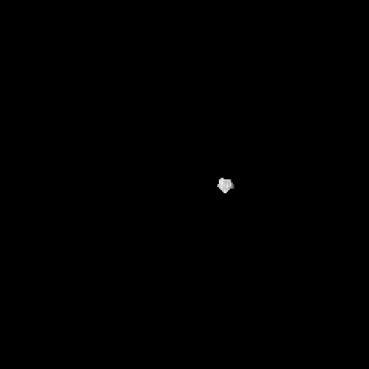

In [14]:
from IPython.display import Image, display

gif_path = './braTS20_flair_slices.gif'
display(Image(filename=gif_path))


Dice_Loss & Dice_Coeff Calculation

In [15]:
import tensorflow as tf
from tensorflow.keras import backend as K

# --- LOSS FUNCTIONS (Squared for Efficiency) ---

def generalized_dice_coef(y_true, y_pred, smooth=1.0):
    # Flatten the 3D images (D, H, W, C) to a 1D vector
    y_true_f = tf.cast(K.flatten(y_true), tf.float32)
    y_pred_f = tf.cast(K.flatten(y_pred), tf.float32)

    # Reshape back to (Batch*D*H*W, 4)
    y_true_c = tf.reshape(y_true_f, [-1, 4])
    y_pred_c = tf.reshape(y_pred_f, [-1, 4])

    total_dice = 0.0
    # Skip Background (start at 1)
    for i in range(1, 4):
        yt = y_true_c[:, i]
        yp = y_pred_c[:, i]

        intersection = K.sum(yt * yp)
        # SQUARED DENOMINATOR (Correct for Loss/Training)
        denominator = K.sum(yt*yt) + K.sum(yp*yp) + smooth
        total_dice += (2. * intersection + smooth) / denominator

    return total_dice / 3.0

def dice_loss(y_true, y_pred):
    return 1 - generalized_dice_coef(y_true, y_pred)

def weighted_dice_loss(y_true, y_pred):
    # Weights: [BG=0.1, Necrotic=1.0, Edema=1.0, Enhancing=3.0]
    # Note: Check your data indices! Usually 3 is Enhancing in BraTS, not Necrotic.
    # If index 3 is Necrotic for you, this is correct.
    class_weights = [0.1, 1.0, 1.0, 3.0]

    smooth = 1e-5
    loss = 0.0

    # Track total weight used for normalization
    total_weight_used = 0.0

    # Loop over Foreground Classes (1, 2, 3)
    for i in range(1, 4):
        y_true_f = K.flatten(y_true[..., i])
        y_pred_f = K.flatten(y_pred[..., i])

        intersection = K.sum(y_true_f * y_pred_f)

        # SQUARED DENOMINATOR (Correct for Loss/Training)
        union = K.sum(y_true_f*y_true_f) + K.sum(y_pred_f*y_pred_f)

        dice = (2. * intersection + smooth) / (union + smooth)

        # Weighted Loss
        loss += class_weights[i] * (1. - dice)
        total_weight_used += class_weights[i]

    # Normalize by the sum of weights actually used (5.0, not 5.1)
    return loss / total_weight_used


# --- METRIC FUNCTIONS (Linear for Standard Reporting) ---

def dice_coef_necrotic(y_true, y_pred, smooth=1e-6):
    y_true_c = tf.cast(y_true[:,:,:,:,1], tf.float32)
    y_pred_c = tf.cast(y_pred[:,:,:,:,1], tf.float32)

    y_true_f = K.flatten(y_true_c)
    y_pred_f = K.flatten(y_pred_c)

    intersection = K.sum(y_true_f * y_pred_f)

    # LINEAR DENOMINATOR (Standard for Reporting)
    denominator = K.sum(y_true_f) + K.sum(y_pred_f) + smooth

    return (2. * intersection + smooth) / denominator

def dice_coef_edema(y_true, y_pred, smooth=1e-6):
    y_true_c = tf.cast(y_true[:,:,:,:,2], tf.float32)
    y_pred_c = tf.cast(y_pred[:,:,:,:,2], tf.float32)

    y_true_f = K.flatten(y_true_c)
    y_pred_f = K.flatten(y_pred_c)

    intersection = K.sum(y_true_f * y_pred_f)
    # LINEAR DENOMINATOR
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_coef_enhancing(y_true, y_pred, smooth=1e-6):
    y_true_c = tf.cast(y_true[:,:,:,:,3], tf.float32)
    y_pred_c = tf.cast(y_pred[:,:,:,:,3], tf.float32)

    y_true_f = K.flatten(y_true_c)
    y_pred_f = K.flatten(y_pred_c)

    intersection = K.sum(y_true_f * y_pred_f)
    # LINEAR DENOMINATOR
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)


In [16]:
IMG_SIZE=64

Spliting Dataset into testing and Validation

In [17]:
train_and_val_directories = [f.path for f in os.scandir(TRAIN_DATASET_PATH) if f.is_dir()]

# file BraTS20_Training_355 has ill formatted name for for seg.nii file
# Better way to remove the bad file
bad_path = os.path.join(TRAIN_DATASET_PATH, 'BraTS20_Training_355')
if bad_path in train_and_val_directories:
    train_and_val_directories.remove(bad_path)


def pathListIntoIds(dirList):
    x = []
    for i in range(0,len(dirList)):
        x.append(dirList[i][dirList[i].rfind('/')+1:])
    return x

train_and_test_ids = pathListIntoIds(train_and_val_directories);


train_test_ids, val_ids = train_test_split(train_and_test_ids,test_size=0.2,random_state=42)
train_ids, test_ids = train_test_split(train_test_ids,test_size=0.15,random_state=42)

In [18]:
import os
import shutil

TRAIN_DATASET_PATH = '/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData'
CACHE_PATH = '3D_VNet_CACHE'
IMG_SIZE = 64

# CHECK: Does the cache already exist and is it not empty?
if os.path.exists(CACHE_PATH) and len(os.listdir(CACHE_PATH)) > 0:
    print(f"--- CACHE FOUND: {CACHE_PATH} ---")
    print(f"Contains {len(os.listdir(CACHE_PATH))} files.")
    print("Skipping deletion to save time. If you WANT to re-generate data, uncomment the deletion line below.")
    # shutil.rmtree(CACHE_PATH)  # Uncomment this line only if you change preprocessing logic!
else:
    print(f"--- CREATING NEW CACHE: {CACHE_PATH} ---")
    if os.path.exists(CACHE_PATH): shutil.rmtree(CACHE_PATH) # Clean up partial/empty folder
    os.makedirs(CACHE_PATH, exist_ok=True)

# Path Verification
full_check_path = os.path.join(TRAIN_DATASET_PATH, 'BraTS20_Training_001')
print(f"Path Check ({full_check_path}): {os.path.isdir(full_check_path)}")



--- CREATING NEW CACHE: 3D_VNet_CACHE ---
Path Check (/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/BraTS20_Training_001): True


In [19]:
import numpy as np
import nibabel as nib
import cv2
import tensorflow as tf
import os
from concurrent.futures import ThreadPoolExecutor

# CONFIG
TRAIN_DATASET_PATH = "/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData"
VOLUME_START_AT = 15
CACHE_PATH = '3D_VNet_CACHE'
IMG_SIZE = 64  # Ensure this is defined globally

def preprocess_and_cache(patient_id):
    try:
        case_path = os.path.join(TRAIN_DATASET_PATH, patient_id)

        # 1. Load Data
        flair = nib.load(os.path.join(case_path, f'{patient_id}_flair.nii')).get_fdata().astype(np.float32)
        ce = nib.load(os.path.join(case_path, f'{patient_id}_t1ce.nii')).get_fdata().astype(np.float32)
        seg = nib.load(os.path.join(case_path, f'{patient_id}_seg.nii')).get_fdata().astype(np.float32)

        # 2. Independent Channel Normalization (Fixing the bug)
        # Normalize FLAIR
        flair_max = np.max(flair)
        if flair_max > 0: flair /= flair_max

        # Normalize T1ce
        ce_max = np.max(ce)
        if ce_max > 0: ce /= ce_max

        # 3. Intelligent Slicing (Downsampling Z-axis)
        original_depth = flair.shape[2]
        slice_indices = np.linspace(VOLUME_START_AT, original_depth - 1, IMG_SIZE, dtype=int)
        slice_indices = np.clip(slice_indices, 0, original_depth - 1)

        # 4. Initialize Output Arrays
        X_vol = np.zeros((IMG_SIZE, IMG_SIZE, IMG_SIZE, 2), dtype=np.float32)
        Y_vol = np.zeros((IMG_SIZE, IMG_SIZE, IMG_SIZE), dtype=np.float32)

        # 5. Resize XY-planes
        for z_out, z_in in enumerate(slice_indices):
            # Resize 240x240 -> 64x64
            X_vol[z_out, :, :, 0] = cv2.resize(flair[:, :, z_in], (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_AREA)
            X_vol[z_out, :, :, 1] = cv2.resize(ce[:, :, z_in], (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_AREA)

            # Seg Mask: Map 4 -> 3
            seg_slice = seg[:, :, z_in]
            seg_slice[seg_slice == 4] = 3
            Y_vol[z_out, :, :] = cv2.resize(seg_slice, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_NEAREST)

        # 6. One-Hot Encoding (Fast Vectorized Way)
        # Input: (64,64,64) -> Output: (64,64,64,4)
        Y_OHE = tf.one_hot(tf.cast(Y_vol, tf.int32), 4).numpy()

        # 7. Save
        np.savez_compressed(
            os.path.join(CACHE_PATH, f'{patient_id}.npz'),
            X=X_vol,
            Y=Y_OHE
        )
        return f"Cached {patient_id}"

    except Exception as e:
        return f"ERROR {patient_id}: {str(e)}"

# --- EXECUTE PARALLEL PROCESSING ---
# Use all_ids (combined train+val+test to cache EVERYTHING)
# If all_ids is not defined, combine your previous lists:
if 'train_ids' in locals() and 'val_ids' in locals() and 'test_ids' in locals():
    all_patients_to_process = train_ids + val_ids + test_ids
else:
    # Fallback: Just read directory (dangerous if not split correctly, but okay for caching)
    all_patients_to_process = [d for d in os.listdir(TRAIN_DATASET_PATH) if 'BraTS' in d]

print(f"Starting parallel caching for {len(all_patients_to_process)} patients...")

# Use 4 workers (safe for Kaggle/Colab)
with ThreadPoolExecutor(max_workers=4) as executor:
    results = list(executor.map(preprocess_and_cache, all_patients_to_process))

# Print first 5 results to verify
for res in results[:5]:
    print(res)
print("Processing Complete.")


Starting parallel caching for 368 patients...
Cached BraTS20_Training_272
Cached BraTS20_Training_113
Cached BraTS20_Training_257
Cached BraTS20_Training_040
Cached BraTS20_Training_015
Processing Complete.


In [20]:
import tensorflow as tf
import numpy as np
import os
import random

# Global variables you already defined:
CACHE_PATH = '3D_VNet_CACHE'
IMG_SIZE = 64
# train_ids (list of patient IDs for training)

class CachedDataGenerator(tf.keras.utils.Sequence):
    def __init__(self, list_IDs, batch_size=1, shuffle=True, cache_path='3D_VNet_CACHE', img_size=64):
        self.list_IDs = list_IDs
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.cache_path = cache_path
        self.img_size = img_size
        self.on_epoch_end()

    def __len__(self):
        # Denotes the number of batches per epoch
        return int(np.floor(len(self.list_IDs) / self.batch_size))

    def __getitem__(self, index):
        # Generates one batch of data
        indexes = self.indexes[index * self.batch_size:(index + 1) * self.batch_size]
        list_IDs_temp = [self.list_IDs[k] for k in indexes]

        X, Y = self.__data_generation(list_IDs_temp)
        return X, Y

    def on_epoch_end(self):
        # Updates indexes after each epoch
        self.indexes = np.arange(len(self.list_IDs))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, list_IDs_temp):
        # X: (batch_size, 64, 64, 64, 2)
        # Y: (batch_size, 64, 64, 64, 4)

        X = np.empty((self.batch_size, self.img_size, self.img_size, self.img_size, 2), dtype=np.float32)
        Y = np.empty((self.batch_size, self.img_size, self.img_size, self.img_size, 4), dtype=np.float32)

        for i, ID in enumerate(list_IDs_temp):
            # Load data directly from the cached .npz file
            file_path = os.path.join(self.cache_path, f'{ID}.npz')
            data = np.load(file_path, mmap_mode='r')

            x_data = data['X'] # Shape (64, 64, 64, 2)
            y_data = data['Y'] # Shape (64, 64, 64, 4)

            # Add batch dimension and store
            X[i,] = x_data
            Y[i,] = y_data

        return X, Y

In [21]:
# Assuming train_ids and val_ids are defined and contain the shuffled patient lists

BATCH_SIZE = 16 # Increased batch size for faster training per epoch

train_generator = CachedDataGenerator(
    list_IDs=train_ids,
    batch_size=BATCH_SIZE,
    shuffle=True,
    cache_path=CACHE_PATH,
    img_size=IMG_SIZE
)

val_generator = CachedDataGenerator(
    list_IDs=val_ids,
    batch_size=BATCH_SIZE,
    shuffle=False,
    cache_path=CACHE_PATH,
    img_size=IMG_SIZE
)

3d Vnet Model

In [23]:
import tensorflow as tf
from tensorflow.keras import backend as K  # <--- FIXED: Added missing import
from tensorflow.keras.layers import Conv3D, BatchNormalization, ReLU, Add, Dropout, Input, concatenate, Conv3DTranspose
from tensorflow.keras.models import Model
from tensorflow.keras.regularizers import l2

# --- CONFIGURATION ---
IMG_SIZE = 64   # Ensure this matches your data preprocessing
NUM_CLASSES = 4 # Background, Edema, Enhancing, Necrotic
L2_STRENGTH = 1e-4
L2_REG = l2(L2_STRENGTH)
# --- 2. MODEL ARCHITECTURE ---

def residual_block_3d(input_tensor, filters, kernel_size=(5, 5, 5), ker_init='he_normal'):
    # 1. Main Path
    x = Conv3D(filters, kernel_size, padding='same', kernel_initializer=ker_init,
               kernel_regularizer=L2_REG)(input_tensor)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    x = Conv3D(filters, kernel_size, padding='same', kernel_initializer=ker_init,
               kernel_regularizer=L2_REG)(x)
    x = BatchNormalization()(x)

    # 2. Shortcut Path
    # Use K.int_shape to safely get channels
    input_shape = K.int_shape(input_tensor)
    input_channels = input_shape[-1]

    if input_channels != filters:
        # Projection shortcut
        shortcut = Conv3D(filters, (1, 1, 1), padding='same', kernel_initializer=ker_init,
                          kernel_regularizer=L2_REG)(input_tensor)
    else:
        # Identity shortcut
        shortcut = input_tensor

    # 3. Add and Activate
    output = Add()([shortcut, x])
    output = ReLU()(output)

    return output

def build_vnet_3d(img_size, num_classes, ker_init='he_normal', dropout=0.5):
    inputs = Input((img_size, img_size, img_size, 2)) # Adjusted for 2 channels input

    # --- ENCODER ---
    # Stage 1
    conv1 = residual_block_3d(inputs, 16, ker_init=ker_init)

    # Down 1
    pool = Conv3D(32, (2, 2, 2), strides=(2, 2, 2), padding='same', kernel_initializer=ker_init,
                  kernel_regularizer=L2_REG)(conv1)
    pool = ReLU()(pool)
    conv = residual_block_3d(pool, 32, ker_init=ker_init)

    # Down 2
    pool1 = Conv3D(64, (2, 2, 2), strides=(2, 2, 2), padding='same', kernel_initializer=ker_init,
                   kernel_regularizer=L2_REG)(conv)
    pool1 = ReLU()(pool1)
    conv2 = residual_block_3d(pool1, 64, ker_init=ker_init)

    # Down 3
    pool2 = Conv3D(128, (2, 2, 2), strides=(2, 2, 2), padding='same', kernel_initializer=ker_init,
                   kernel_regularizer=L2_REG)(conv2)
    pool2 = ReLU()(pool2)
    conv3 = residual_block_3d(pool2, 128, ker_init=ker_init)

    # Down 4
    pool4 = Conv3D(256, (2, 2, 2), strides=(2, 2, 2), padding='same', kernel_initializer=ker_init,
                   kernel_regularizer=L2_REG)(conv3)
    pool4 = ReLU()(pool4)

    # --- BOTTLENECK ---
    conv5 = residual_block_3d(pool4, 256, ker_init=ker_init)
    drop5 = Dropout(dropout)(conv5) # Dropout added here

    # --- DECODER ---
    # Up 1
    up7 = Conv3DTranspose(128, (2, 2, 2), strides=(2, 2, 2), padding='same', kernel_initializer=ker_init,
                          kernel_regularizer=L2_REG)(drop5)
    merge7 = concatenate([conv3, up7], axis=-1)
    conv7 = residual_block_3d(merge7, 128, ker_init=ker_init)

    # Up 2
    up8 = Conv3DTranspose(64, (2, 2, 2), strides=(2, 2, 2), padding='same', kernel_initializer=ker_init,
                          kernel_regularizer=L2_REG)(conv7)
    merge8 = concatenate([conv2, up8], axis=-1)
    conv8 = residual_block_3d(merge8, 64, ker_init=ker_init)

    # Up 3
    up9 = Conv3DTranspose(32, (2, 2, 2), strides=(2, 2, 2), padding='same', kernel_initializer=ker_init,
                          kernel_regularizer=L2_REG)(conv8)
    merge9 = concatenate([conv, up9], axis=-1)
    conv9 = residual_block_3d(merge9, 32, ker_init=ker_init)

    # Up 4
    up = Conv3DTranspose(16, (2, 2, 2), strides=(2, 2, 2), padding='same', kernel_initializer=ker_init,
                         kernel_regularizer=L2_REG)(conv9)
    merge = concatenate([conv1, up], axis=-1)
    conv_final = residual_block_3d(merge, 16, ker_init=ker_init)

    # Output
    outputs = Conv3D(num_classes, (1, 1, 1), activation='softmax')(conv_final)

    model = Model(inputs=inputs, outputs=outputs)
    return model

# --- 3. INSTANTIATE AND COMPILE ---

# Note: I slightly increased filter counts (16->32->64...) to standard VNet sizes
# to ensure it has capacity to learn features, but kept L2+Dropout to stop overfitting.
model = build_vnet_3d(IMG_SIZE, NUM_CLASSES, ker_init='he_normal', dropout=0.5)

# Compile with the NEW weighted loss
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), # Lower LR is safer for 3D
    loss=weighted_dice_loss,
    metrics=['accuracy'] # Add your other dice metrics here if defined
)

model.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 64, 64,    │          0 │ -                 │
│ (InputLayer)        │ 64, 2)            │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_28 (Conv3D)  │ (None, 64, 64,    │      4,016 │ input_layer_1[0]… │
│                     │ 64, 16)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │         64 │ conv3d_28[0][0]   │
│ (BatchNormalizatio… │ 64, 16)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_22 (ReLU)     │ (None, 64, 64,    │          0 │ batch_normalizat… │
│                     │ 64, 16)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_29 (Conv3D)  │ (None, 64, 64,    │     32,016 │ re_lu_22[0][0]    │
│                     │ 64, 16)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_30 (Conv3D)  │ (None, 64, 64,    │         48 │ input_layer_1[0]… │
│                     │ 64, 16)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │         64 │ conv3d_29[0][0]   │
│ (BatchNormalizatio… │ 64, 16)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_9 (Add)         │ (None, 64, 64,    │          0 │ conv3d_30[0][0],  │
│                     │ 64, 16)           │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_23 (ReLU)     │ (None, 64, 64,    │          0 │ add_9[0][0]       │
│                     │ 64, 16)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_31 (Conv3D)  │ (None, 32, 32,    │      4,128 │ re_lu_23[0][0]    │
│                     │ 32, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_24 (ReLU)     │ (None, 32, 32,    │          0 │ conv3d_31[0][0]   │
│                     │ 32, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_32 (Conv3D)  │ (None, 32, 32,    │    128,032 │ re_lu_24[0][0]    │
│                     │ 32, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │        128 │ conv3d_32[0][0]   │
│ (BatchNormalizatio… │ 32, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_25 (ReLU)     │ (None, 32, 32,    │          0 │ batch_normalizat… │
│                     │ 32, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_33 (Conv3D)  │ (None, 32, 32,    │    128,032 │ re_lu_25[0][0]    │
│                     │ 32, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │        128 │ conv3d_33[0][0]   │
│ (BatchNormalizatio… │ 32, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_10 (Add)        │ (None, 32, 32,    │          0 │ re_lu_24[0][0], 

 Total params: 30,704,276 (117.13 MB)

 Trainable params: 30,701,332 (117.12 MB)

 Non-trainable params: 2,944 (11.50 KB)

Optimizer

In [24]:
import tensorflow as tf
import numpy as np

# --- 1. DEFINITION OF THE WRAPPER FUNCTION ---
def wrap_generator(generator):
    """Wrapper to make Keras Sequence infinite for tf.data"""
    while True:
        for i in range(len(generator)):
            X, Y = generator[i]
            yield X, Y

        # Correctly indented shuffle trigger
        generator.on_epoch_end()

# --- 2. GET OUTPUT SIGNATURE ---
try:
    temp_X, temp_Y = train_generator[0]
except NameError:
    print("FATAL ERROR: 'train_generator' not defined.")
    raise

output_shapes = (
    tf.TensorSpec(shape=temp_X.shape, dtype=temp_X.dtype),
    tf.TensorSpec(shape=temp_Y.shape, dtype=temp_Y.dtype)
)

# --- 3. CREATE DATASETS ---
train_dataset = tf.data.Dataset.from_generator(
    lambda: wrap_generator(train_generator),
    output_signature=output_shapes
).prefetch(tf.data.AUTOTUNE)

val_dataset = tf.data.Dataset.from_generator(
    lambda: wrap_generator(val_generator),
    output_signature=output_shapes
).prefetch(tf.data.AUTOTUNE)

# --- 4. STEPS ---
STEPS_PER_EPOCH = len(train_generator)
VALIDATION_STEPS = len(val_generator)

print(f"Datasets Ready. Training Steps: {STEPS_PER_EPOCH}, Val Steps: {VALIDATION_STEPS}")

Datasets Ready. Training Steps: 15, Val Steps: 4


In [25]:
import tensorflow.keras as keras
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, CSVLogger

# CONFIG
WEIGHT_FILENAME = 'best_3D_VNet_weights.weights.h5'

# 1. Callbacks
callbacks = [
    ModelCheckpoint(
        filepath=WEIGHT_FILENAME,
        monitor='val_generalized_dice_coef', # Ensure this matches your metric function name!
        verbose=1,
        save_best_only=True,
        mode='max',
        save_weights_only=True
    ),
    EarlyStopping(
        monitor='val_loss',
        min_delta=0.0001,
        patience=15,
        verbose=1,
        mode='min',
        restore_best_weights=True
    ),
    ReduceLROnPlateau(
        monitor='val_generalized_dice_coef',
        factor=0.5,
        patience=8,
        min_lr=1e-6,
        verbose=1,
        mode='max'
    ),
    CSVLogger('training.log', separator=',', append=True) # Append=True so you don't overwrite logs on resume
]

# 2. Build & Compile
K.clear_session()
model = build_vnet_3d(IMG_SIZE, NUM_CLASSES, ker_init='he_normal', dropout=0.5)

model.compile(
    loss=weighted_dice_loss,
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    metrics=[
        'accuracy',
        generalized_dice_coef,   # This will create 'val_generalized_dice_coef'
        dice_coef_necrotic,
        dice_coef_edema,
        dice_coef_enhancing      # Corrected spelling
    ]
)

# 3. Resume Logic (Dynamic)
initial_epoch = 0
if os.path.exists(WEIGHT_FILENAME):
    print(f"--- RESUMING: Found {WEIGHT_FILENAME} ---")
    try:
        model.load_weights(WEIGHT_FILENAME)
        print("Weights loaded.")

        # LOGIC: Check log file to find last epoch
        if os.path.exists('training.log'):
            with open('training.log', 'r') as f:
                lines = f.readlines()
                if len(lines) > 1:
                    last_line = lines[-1]
                    try:
                        last_epoch = int(last_line.split(',')[0]) # Assuming epoch is first column
                        initial_epoch = last_epoch + 1
                        print(f"Detected last epoch {last_epoch}. Resuming at {initial_epoch}.")
                    except:
                        print("Could not parse log file. Using manual override or 0.")
    except Exception as e:
        print(f"Error loading weights: {e}")

# 4. Train
history = model.fit(
    train_dataset,
    epochs=100,
    initial_epoch=initial_epoch,
    steps_per_epoch=STEPS_PER_EPOCH,
    callbacks=callbacks,
    validation_data=val_dataset,
    validation_steps=VALIDATION_STEPS
)

model.save_weights("final_weights.h5")



Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6484 - dice_coef_edema: 0.0248 - dice_coef_enhancing: 0.0084 - dice_coef_necrotic: 0.0028 - generalized_dice_coef: 0.0371 - loss: 1.4996
Epoch 1: val_generalized_dice_coef improved from -inf to 0.01831, saving model to best_3D_VNet_weights.weights.h5
15/15 ━━━━━━━━━━━━━━━━━━━━ 209s 3s/step - accuracy: 0.6529 - dice_coef_edema: 0.0260 - dice_coef_enhancing: 0.0086 - dice_coef_necrotic: 0.0028 - generalized_dice_coef: 0.0384 - loss: 1.4981 - val_accuracy: 0.2241 - val_dice_coef_edema: 0.0086 - val_dice_coef_enhancing: 0.0075 - val_dice_coef_necrotic: 0.0031 - val_generalized_dice_coef: 0.0183 - val_loss: 1.4817 - learning_rate: 1.0000e-04
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7975 - dice_coef_edema: 0.0693 - dice_coef_enhancing: 0.0161 - dice_coef_necrotic: 0.0020 - generalized_dice_coef: 0.1029 - loss: 1.4115
Epoch 2: val_generalized_dice_coef improved from 0.01831 to 0.01863, saving model to best_

ValueError: The filename must end in `.weights.h5`. Received: filepath=final_weights.h5

In [49]:
import pandas as pd
from google.colab import files

# 1. Check if it's already a DataFrame
if isinstance(history, pd.DataFrame):
    print("Your 'history' variable is already a table. Saving directly...")
    history.to_csv('my_training_log.csv', index=False)
else:
    # If it is NOT a dataframe (it's the original Keras object), convert it
    print("Converting Keras History to CSV...")
    df = pd.DataFrame(history.history)
    df.to_csv('my_training_log.csv', index=False)

# 2. Download
files.download('my_training_log.csv')


Your 'history' variable is already a table. Saving directly...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [26]:
# Save in the modern Keras format
model.save_weights('final_model_weights.weights.h5')
print("Saved successfully!")



Saved successfully!


In [47]:
from google.colab import files

# Make sure this filename matches exactly what you saved earlier
filename = 'final_model_weights.weights.h5'

files.download(filename)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [28]:
import matplotlib.pyplot as plt

def predictByPath(case_path, case):
    # 1. Load NIfTI
    flair = nib.load(os.path.join(case_path, f'{case}_flair.nii')).get_fdata()
    ce = nib.load(os.path.join(case_path, f'{case}_t1ce.nii')).get_fdata()

    # 2. Preprocess (Must match training exactly!)
    original_depth = flair.shape[2]
    processed_volume = np.empty((IMG_SIZE, IMG_SIZE, IMG_SIZE, 2))

    slice_indices = np.linspace(VOLUME_START_AT, original_depth - 1, IMG_SIZE, dtype=int)
    slice_indices = np.clip(slice_indices, VOLUME_START_AT, original_depth - 1)

    for i, idx in enumerate(slice_indices):
        processed_volume[i, :, :, 0] = cv2.resize(flair[:, :, idx], (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_AREA)
        processed_volume[i, :, :, 1] = cv2.resize(ce[:, :, idx], (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_AREA)

    # 3. Independent Normalization (Fixing the bug)
    max_flair = np.max(processed_volume[..., 0])
    if max_flair > 0: processed_volume[..., 0] /= max_flair

    max_ce = np.max(processed_volume[..., 1])
    if max_ce > 0: processed_volume[..., 1] /= max_ce

    # 4. Predict
    input_tensor = np.expand_dims(processed_volume, axis=0)
    predictions = model.predict(input_tensor, verbose=1)

    return predictions, slice_indices

def showPredictsById(case_id, start_slice=32):
    # Dictionary for labels
    SEGMENT_CLASSES = {1: 'Necrotic', 2: 'Edema', 3: 'Enhancing'}

    path = os.path.join(TRAIN_DATASET_PATH, f'BraTS20_Training_{case_id}')
    gt_vol = nib.load(os.path.join(path, f'BraTS20_Training_{case_id}_seg.nii')).get_fdata()
    orig_vol = nib.load(os.path.join(path, f'BraTS20_Training_{case_id}_flair.nii')).get_fdata()

    # Get Prediction
    p_preds, sampled_indices = predictByPath(path, f'BraTS20_Training_{case_id}')
    prediction = p_preds[0] # (64, 64, 64, 4)

    # Validation Check
    if start_slice >= IMG_SIZE: start_slice = IMG_SIZE // 2
    original_idx = sampled_indices[start_slice]

    # Plotting
    f, ax = plt.subplots(1, 6, figsize=(20, 5))

    # Background Image (Original Slice)
    bg_img = cv2.resize(orig_vol[:,:,original_idx], (IMG_SIZE, IMG_SIZE))

    # 0. Original
    ax[0].imshow(bg_img, cmap='gray')
    ax[0].set_title('Original FLAIR')

    # 1. Ground Truth (Merged)
    gt_slice = cv2.resize(gt_vol[:,:,original_idx], (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_NEAREST)
    ax[1].imshow(gt_slice, cmap='jet', alpha=0.9)
    ax[1].set_title('Ground Truth')

    # 2. Prediction (Merged - Max Probability)
    # Convert Softmax (Probabilities) -> Hard Mask (0, 1, 2, 3)
    pred_mask = np.argmax(prediction[start_slice, :, :, :], axis=-1)
    ax[2].imshow(pred_mask, cmap='jet', alpha=0.9)
    ax[2].set_title('Predicted (All)')

    # 3. Edema (Class 2)
    ax[3].imshow(prediction[start_slice, :, :, 2], cmap='hot')
    ax[3].set_title('Edema Prob')

    # 4. Necrotic (Class 1)
    ax[4].imshow(prediction[start_slice, :, :, 1], cmap='hot')
    ax[4].set_title('Necrotic Prob')

    # 5. Enhancing (Class 3)
    ax[5].imshow(prediction[start_slice, :, :, 3], cmap='hot')
    ax[5].set_title('Enhancing Prob')

    plt.show()

# Example Usage:
# showPredictsById('001', start_slice=32)


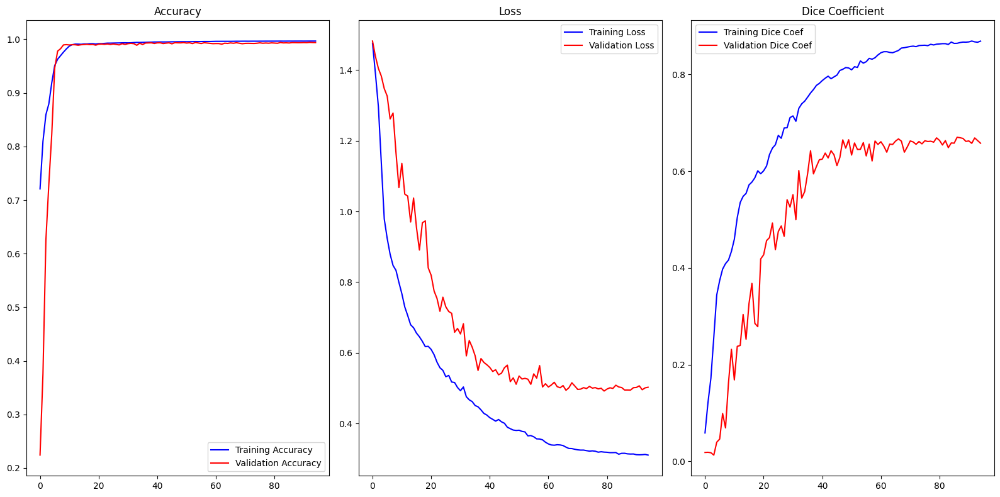

In [31]:
# Load the training history from the log file
import pandas as pd
history = pd.read_csv('training.log', sep=',', engine='python')

hist = history

# Extract metrics for plotting
acc = hist['accuracy']
val_acc = hist['val_accuracy']

epoch = range(len(acc))

loss = hist['loss']
val_loss = hist['val_loss']

train_dice = hist['generalized_dice_coef'] # Corrected column name
val_dice = hist['val_generalized_dice_coef'] # Corrected column name

# Create subplots for visualization
f, ax = plt.subplots(1, 3, figsize=(16, 8))

ax[0].plot(epoch, acc, 'b', label='Training Accuracy')
ax[0].plot(epoch, val_acc, 'r', label='Validation Accuracy')
ax[0].legend()
ax[0].set_title('Accuracy')

ax[1].plot(epoch, loss, 'b', label='Training Loss')
ax[1].plot(epoch, val_loss, 'r', label='Validation Loss')
ax[1].legend()
ax[1].set_title('Loss')

ax[2].plot(epoch, train_dice, 'b', label='Training Dice Coef')
ax[2].plot(epoch, val_dice, 'r', label='Validation Dice Coef')
ax[2].legend()
ax[2].set_title('Dice Coefficient')


plt.tight_layout()
plt.show()

Getting 3D prediction for case: BraTS20_Training_195
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


/tmp/ipython-input-2586807722.py:111: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


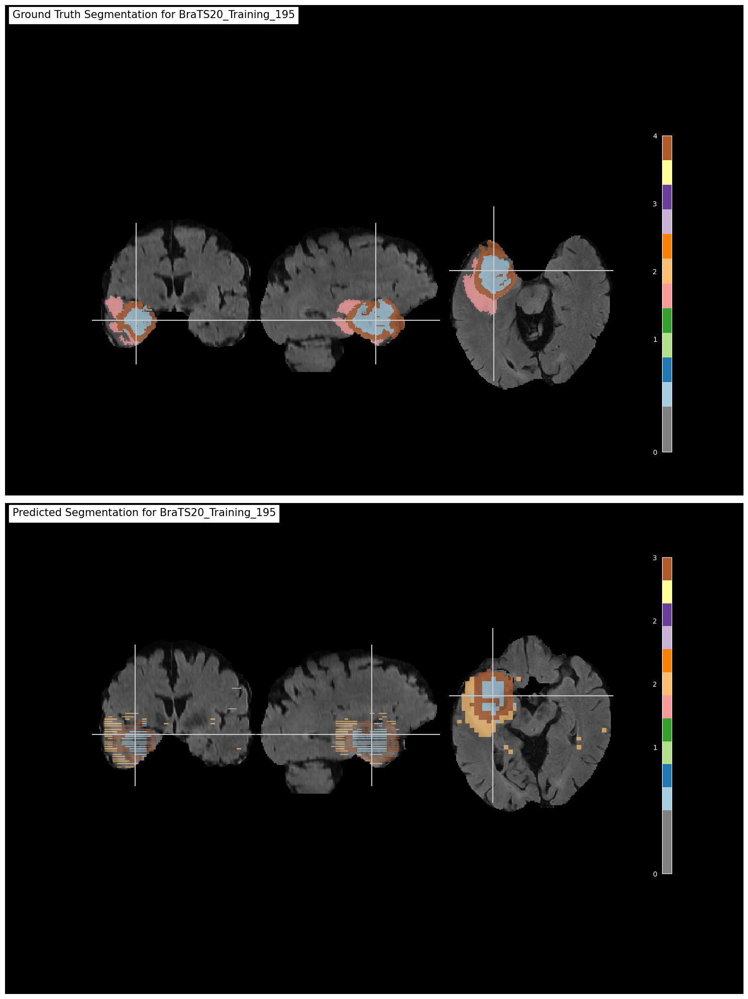

In [32]:
import nibabel as nib
import numpy as np
import cv2
import nilearn.image as image
import nilearn.plotting as plotting
import matplotlib.pyplot as plt
import os
from sklearn.model_selection import train_test_split # Needed for test_ids definition

# --- Start of code to define test_ids (copied from cell ZrQyEqUVHW5b) ---
# TRAIN_DATASET_PATH is already defined globally
train_and_val_directories = [f.path for f in os.scandir(TRAIN_DATASET_PATH) if f.is_dir()]

# file BraTS20_Training_355 has ill formatted name for for seg.nii file
# Correcting the path construction using os.path.join
train_and_val_directories.remove(os.path.join(TRAIN_DATASET_PATH, 'BraTS20_Training_355'))

def pathListIntoIds(dirList):
    x = []
    for i in range(0,len(dirList)):
        x.append(dirList[i][dirList[i].rfind('/')+1:])
    return x

train_and_test_ids = pathListIntoIds(train_and_val_directories);

train_test_ids, val_ids = train_test_split(train_and_test_ids,test_size=0.2)
train_ids, test_ids = train_test_split(train_test_ids,test_size=0.15)
# --- End of code to define test_ids ---

# Select a case from the test_ids for 3D visualization
case_id_full = test_ids[0] # Example: 'BraTS20_Training_230'

case_path = os.path.join(TRAIN_DATASET_PATH, case_id_full)

# Load the original flair image (background for plotting)
original_flair_nifti_path = os.path.join(case_path, f'{case_id_full}_flair.nii')
original_flair_img_obj = nib.load(original_flair_nifti_path)

# Load the ground truth segmentation (for comparison)
original_seg_nifti_path = os.path.join(case_path, f'{case_id_full}_seg.nii')
original_seg_img_obj = nib.load(original_seg_nifti_path)

print(f"Getting 3D prediction for case: {case_id_full}")
# Get the model's 3D prediction for this case
# The predictByPath function returns a tuple: (predictions_batch, sampled_original_indices)
# predictions_batch has shape (1, IMG_SIZE, IMG_SIZE, IMG_SIZE, 4)
predictions_batch, sampled_original_indices = predictByPath(case_path, case_id_full)

# Extract the single predicted volume from the batch, shape becomes (IMG_SIZE, IMG_SIZE, IMG_SIZE, 4)
predicted_volume = predictions_batch[0]

# Convert predicted probabilities to class labels (0, 1, 2, 3)
# np.argmax selects the class with the highest probability for each voxel
predicted_mask_labels = np.argmax(predicted_volume, axis=-1) # Shape: (IMG_SIZE, IMG_SIZE, IMG_SIZE)

# The model was trained on a subset of slices (VOLUME_START_AT to VOLUME_START_AT + VOLUME_SLICES)
# and resized to IMG_SIZE. We need to reconstruct a full 3D volume that matches
# the original NIfTI dimensions for plotting with nilearn.

# Get original image dimensions (e.g., (240, 240, 155))
original_volume_shape = original_flair_img_obj.shape

# Create an empty 3D array for the reconstructed predicted mask,
# with the same dimensions as the original NIfTI file, initialized with 'NOT tumor' class (0)
reconstructed_predicted_mask_data = np.zeros(original_volume_shape, dtype=np.uint8)

# Populate the reconstructed mask with resized predicted slices
for i in range(IMG_SIZE):
    # Map the model's IMG_SIZE depth index 'i' back to the original NIfTI's slice index
    # using the `sampled_original_indices` list obtained from `predictByPath`.
    original_slice_idx = sampled_original_indices[i]

    if original_slice_idx < original_volume_shape[2]: # Ensure we stay within original volume bounds
        # Get the predicted slice (IMG_SIZE, IMG_SIZE) from the 3D predicted_mask_labels
        pred_slice = predicted_mask_labels[i, :, :]

        # Resize the predicted slice back to the original image slice dimensions (e.g., 240x240)
        # Using INTER_NEAREST for categorical data to avoid interpolation artifacts
        resized_pred_slice = cv2.resize(
            pred_slice.astype(np.float32), # cv2.resize expects float input
            (original_volume_shape[0], original_volume_shape[1]),
            interpolation=cv2.INTER_NEAREST
        )

        # Place the resized slice into the correct position in the reconstructed volume
        reconstructed_predicted_mask_data[:, :, original_slice_idx] = resized_pred_slice

# Create a Nifti1Image object from the reconstructed predicted mask data
# It must have the same affine transformation matrix as the original image
# so that nilearn can correctly place it in space.
predicted_mask_nifti_obj = nib.Nifti1Image(reconstructed_predicted_mask_data, original_flair_img_obj.affine)


# Plotting the results using nilearn
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(15, 20))

plotting.plot_roi(original_seg_img_obj,
               title=f'Ground Truth Segmentation for {case_id_full}',
               bg_img=original_flair_img_obj,
               axes=axes[0],
               cmap='Paired', # A diverging colormap suitable for categorical masks
               annotate=False) # No annotations for cleaner plot

plotting.plot_roi(predicted_mask_nifti_obj,
               title=f'Predicted Segmentation for {case_id_full}',
               bg_img=original_flair_img_obj,
               axes=axes[1],
               cmap='Paired',
               annotate=False)

plt.tight_layout()
plt.show()

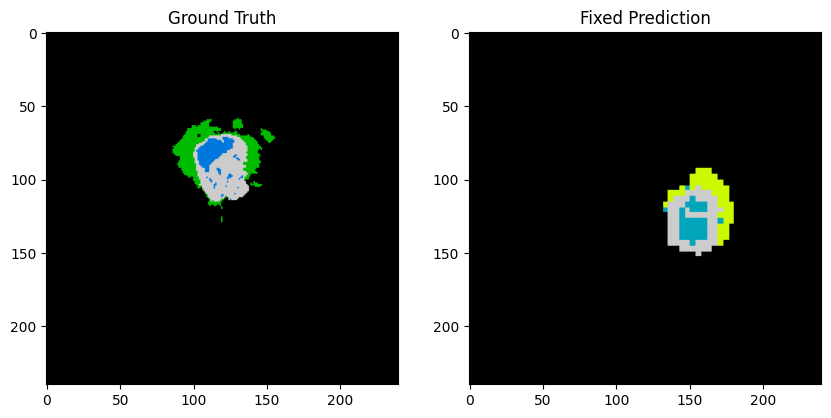

In [73]:
# Try flipping the prediction to match ground truth orientation
fixed_prediction = np.rot90(clean_pred_array[:, :, best_slice], k=1) # Rotate 90 degrees
# OR try: fixed_prediction = np.fliplr(clean_pred_array[:, :, best_slice])

plt.figure(figsize=(10, 5))
plt.subplot(1,2,1); plt.title("Ground Truth"); plt.imshow(ground_truth_data[:, :, best_slice], cmap='nipy_spectral')
plt.subplot(1,2,2); plt.title("Fixed Prediction"); plt.imshow(fixed_prediction, cmap='nipy_spectral')
plt.show()




--- Running Connected Component Analysis ---
Found 200 separate tumor blobs.
Removed 174 small noise blobs (< 100 pixels).
--------------------------------------------
Visualizing Slice 56 (Center of Tumor)


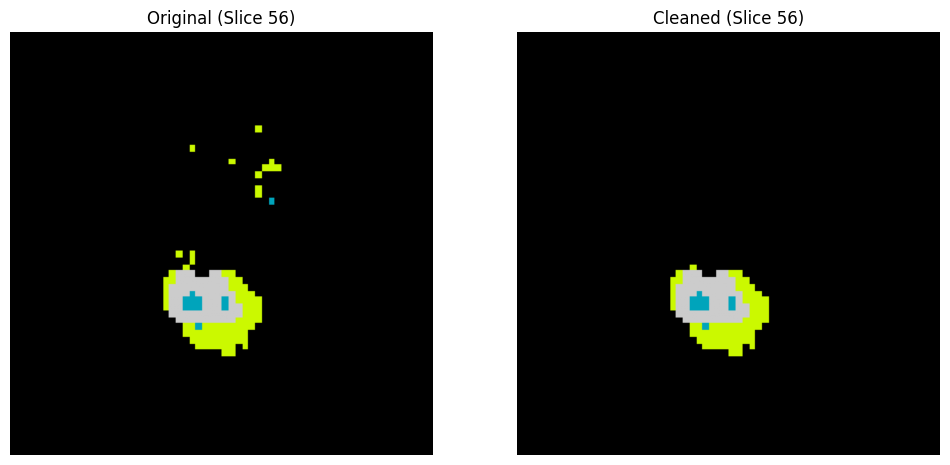

In [44]:
import numpy as np
import scipy.ndimage as ndimage
import nibabel as nib
import matplotlib.pyplot as plt

# --- 1. DEFINE THE CLEANING FUNCTION ---
def post_process_clean_tumor(prediction_mask, min_size=100):
    """
    Removes small disconnected blobs (noise) from the prediction.
    Inputs:
        prediction_mask: 3D numpy array with classes (0, 1, 2, 4) or (0, 1, 2, 3)
        min_size: integer, blobs smaller than this volume will be removed.
    Returns:
        cleaned_prediction: 3D numpy array with noise removed.
    """
    print("--- Running Connected Component Analysis ---")

    # Create binary mask (Tumor=1, Background=0)
    binary_tumor = (prediction_mask > 0).astype(int)

    # Find connected blobs
    labeled_array, num_features = ndimage.label(binary_tumor)

    print(f"Found {num_features} separate tumor blobs.")

    # Calculate blob sizes
    blob_sizes = ndimage.sum(binary_tumor, labeled_array, range(num_features + 1))

    # Create filter: Keep blobs > min_size
    mask_to_keep = blob_sizes > min_size
    mask_to_keep[0] = 0  # Background is always 0

    # Apply filter
    clean_binary_mask = mask_to_keep[labeled_array]

    # Apply back to original multi-class prediction
    cleaned_prediction = prediction_mask * clean_binary_mask

    removed_count = num_features - np.sum(mask_to_keep)
    print(f"Removed {removed_count} small noise blobs (< {min_size} pixels).")
    print("--------------------------------------------")

    return cleaned_prediction

# --- 2. LOAD DATA & RUN CLEANING ---

# Get data from Nifti object (Fixes the TypeError)
noisy_data_array = predicted_mask_nifti_obj.get_fdata().astype(int)

# Run the function
clean_pred_array = post_process_clean_tumor(noisy_data_array, min_size=100)

# Convert back to 32-bit int (Fixes the ValueError)
clean_pred_array = clean_pred_array.astype(np.int32)

# Save into new Nifti object
clean_pred_nifti_obj = nib.Nifti1Image(clean_pred_array, predicted_mask_nifti_obj.affine)

# --- 3. AUTO-FIND TUMOR SLICE & VISUALIZE ---

# Find the slice with the most tumor pixels (prevents "Black Screen" error)
z_axis_profile = np.sum(clean_pred_array, axis=(0, 1))
best_slice_idx = np.argmax(z_axis_profile)

if z_axis_profile[best_slice_idx] == 0:
    print("WARNING: Result is empty! Try lowering 'min_size' in the function.")
else:
    print(f"Visualizing Slice {best_slice_idx} (Center of Tumor)")
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.title(f"Original (Slice {best_slice_idx})")
    plt.imshow(noisy_data_array[:, :, best_slice_idx], cmap='nipy_spectral')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title(f"Cleaned (Slice {best_slice_idx})")
    plt.imshow(clean_pred_array[:, :, best_slice_idx], cmap='nipy_spectral')
    plt.axis('off')

    plt.show()


Auto-Crop: Rendering slices 67 to 188 (Axis 0)
GIF saved to ./braTS20_CLEANED_sagittal.gif
Sagittal View (Cleaned):


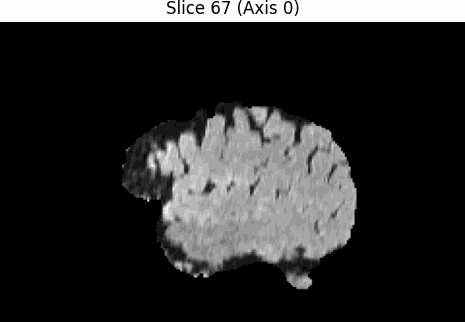

In [46]:
import nibabel as nib
import numpy as np
import imageio.v2 as imageio
import matplotlib.pyplot as plt
import os
from IPython.display import Image, display

def create_gif_from_nifti_object(nifti_img_obj, gif_path, slice_axis=2, start_slice=None, end_slice=None, step=1, bg_nifti_img_obj=None, mask_alpha=0.6):
    """
    Creates a GIF from slices, automatically cropping to the tumor region.
    """
    mask_data = nifti_img_obj.get_fdata().astype(int)
    bg_data = None
    if bg_nifti_img_obj is not None:
        bg_data = bg_nifti_img_obj.get_fdata()

    total_slices = mask_data.shape[slice_axis]

    # --- AUTO-CROP LOGIC (Smart Slice Selection) ---
    # If the user didn't specify slices, find where the tumor is!
    if start_slice is None or end_slice is None:
        if np.sum(mask_data) > 0:
            # Collapse dimensions to find slices with tumor
            axes_to_sum = tuple([i for i in range(3) if i != slice_axis])
            tumor_profile = np.sum(mask_data, axis=axes_to_sum)
            valid_indices = np.where(tumor_profile > 0)[0]

            # Add 5 slices padding before and after
            calculated_start = max(0, valid_indices[0] - 5)
            calculated_end = min(total_slices, valid_indices[-1] + 5)

            # Use calculated values if user didn't provide them
            start_slice = start_slice if start_slice is not None else calculated_start
            end_slice = end_slice if end_slice is not None else calculated_end
            print(f"Auto-Crop: Rendering slices {start_slice} to {end_slice} (Axis {slice_axis})")
        else:
            # Fallback if empty
            start_slice = 0
            end_slice = total_slices

    slices = []

    for i in range(start_slice, end_slice, step):
        fig, ax = plt.subplots(figsize=(6, 6))

        # Get background slice
        if bg_data is not None:
            if slice_axis == 0:
                bg_slice = bg_data[i, :, :]
            elif slice_axis == 1:
                bg_slice = bg_data[:, i, :]
            else:
                bg_slice = bg_data[:, :, i]

            # Rotate for correct medical view
            bg_slice = np.rot90(bg_slice)

            # Normalize background
            min_val_bg = np.min(bg_slice)
            max_val_bg = np.max(bg_slice)
            if (max_val_bg - min_val_bg) == 0:
                bg_slice_norm = np.zeros_like(bg_slice, dtype=np.float32)
            else:
                bg_slice_norm = (bg_slice - min_val_bg) / (max_val_bg - min_val_bg)
            ax.imshow(bg_slice_norm, cmap='gray')

        # Get mask slice
        if slice_axis == 0:
            mask_slice = mask_data[i, :, :]
        elif slice_axis == 1:
            mask_slice = mask_data[:, i, :]
        else:
            mask_slice = mask_data[:, :, i]

        # Rotate mask to match background
        mask_slice = np.rot90(mask_slice)

        # Overlay only non-zero pixels
        masked_array = np.ma.masked_where(mask_slice == 0, mask_slice)
        ax.imshow(masked_array, cmap='autumn', alpha=mask_alpha)

        ax.set_title(f"Slice {i} (Axis {slice_axis})")
        ax.axis('off')

        # Save plot to temp file
        plt.savefig('temp_slice.png', bbox_inches='tight', pad_inches=0)
        plt.close(fig)
        slices.append(imageio.imread('temp_slice.png'))

    # Save GIF
    imageio.mimsave(gif_path, slices, duration=0.1)
    if os.path.exists('temp_slice.png'):
        os.remove('temp_slice.png')
    print(f'GIF saved to {gif_path}')


# --- RUN IT FOR SAGITTAL VIEW (With Clean Mask) ---

output_predicted_gif_sagittal = './braTS20_CLEANED_sagittal.gif'

# KEY CHANGE: Passing 'clean_pred_nifti_obj' instead of the old noisy one
create_gif_from_nifti_object(
    clean_pred_nifti_obj,
    output_predicted_gif_sagittal,
    slice_axis=0, # Sagittal
    bg_nifti_img_obj=original_flair_img_obj
)

print("Sagittal View (Cleaned):")
display(Image(filename=output_predicted_gif_sagittal))



Auto-Crop: Rendering slices 78 to 166 (Axis 1)
GIF saved to ./braTS20_predicted_mask_slices_coronal_overlay.gif
Coronal View:


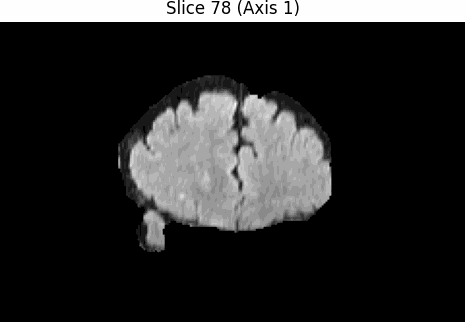

In [52]:
# --- Create GIF for the Predicted Mask (Coronal View) ---

output_predicted_gif_coronal = './braTS20_predicted_mask_slices_coronal_overlay.gif'

# `predicted_mask_nifti_obj` and `original_flair_img_obj` were created in cell `79a1eac0`
create_gif_from_nifti_object(clean_pred_nifti_obj, output_predicted_gif_coronal,
                             slice_axis=1, bg_nifti_img_obj=original_flair_img_obj)

print("Coronal View:")
# Display the GIF
from IPython.display import Image, display
display(Image(filename=output_predicted_gif_coronal))

Auto-Crop: Rendering slices 21 to 103 (Axis 2)
GIF saved to ./braTS20_predicted_mask_slices_transverse_overlay.gif
Transverse View:


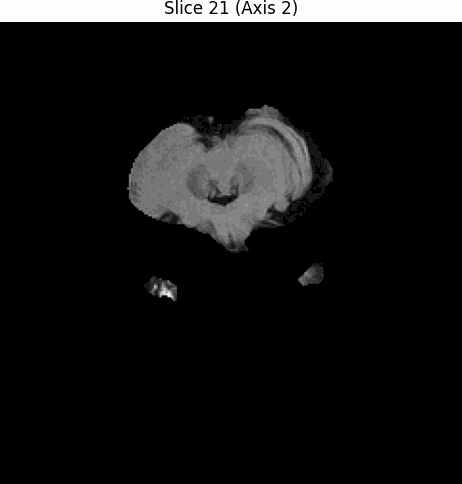

In [53]:
# --- Create GIF for the Predicted Mask (Transverse View) ---

output_predicted_gif_transverse = './braTS20_predicted_mask_slices_transverse_overlay.gif'

# `predicted_mask_nifti_obj` and `original_flair_img_obj` were created in cell `79a1eac0`
create_gif_from_nifti_object(clean_pred_nifti_obj, output_predicted_gif_transverse,
                             slice_axis=2, bg_nifti_img_obj=original_flair_img_obj)

print("Transverse View:")
# Display the GIF
from IPython.display import Image, display
display(Image(filename=output_predicted_gif_transverse))

In [63]:
from tensorflow.keras.utils import plot_model

# Use the variable name of your ALREADY TRAINED model
# It is likely named 'model' or 'my_model'
plot_model(
    model,
    to_file='model_architecture_safe.png',
    show_shapes=True,
    show_layer_names=True
)

print("Saved diagram of existing model to model_architecture_safe.png")
display(Image('model_architecture_safe.png'))




Saved diagram of existing model to model_architecture_safe.png


In [64]:
from google.colab import files
files.download('model_architecture_safe.png')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/tmp/ipython-input-2765836405.py:4: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


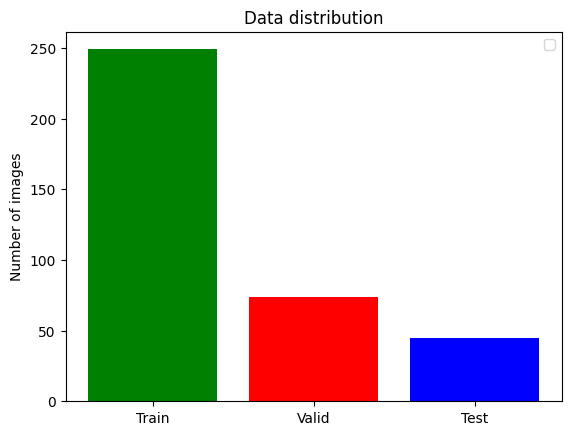

In [60]:
def showDataLayout():
    plt.bar(["Train","Valid","Test"],
    [len(train_ids), len(val_ids), len(test_ids)], align='center',color=[ 'green','red', 'blue'])
    plt.legend()

    plt.ylabel('Number of images')
    plt.title('Data distribution')

    plt.show()

showDataLayout()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


<Figure size 1200x600 with 0 Axes>

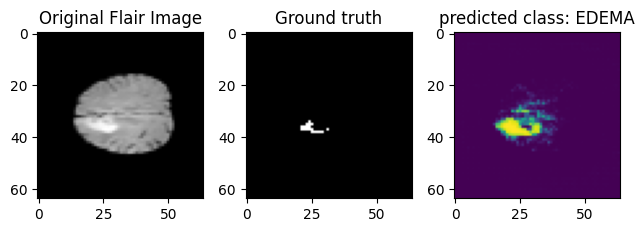

In [50]:
import numpy as np
import nibabel as nib
import cv2
import matplotlib.pyplot as plt
import os
from sklearn.model_selection import train_test_split # Needed for test_ids definition

# --- Global variables needed for this cell (ensuring they are defined) ---
# These should ideally be defined in earlier setup cells, but are included here for robustness.
TRAIN_DATASET_PATH = '/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData'
IMG_SIZE = 64 # Adjusted to 64 to match preprocessing
VOLUME_START_AT = 15 # Assuming this value from previous preprocess_and_cache logic
SEGMENT_CLASSES = {
    0 : 'NOT tumor',
    1 : 'NECROTIC/CORE', # or NON-ENHANCING tumor CORE
    2 : 'EDEMA',
    3 : 'ENHANCING' # original 4 -> converted into 3 later
}

# --- Re-define test_ids for robustness ---
# This section is copied from earlier cells (ZrQyEqUVHW5b and 79a1eac0) to ensure test_ids is available.
train_and_val_directories = [f.path for f in os.scandir(TRAIN_DATASET_PATH) if f.is_dir()]

# file BraTS20_Training_355 has ill formatted name for for seg.nii file
# It's important to use os.path.join for path concatenation to handle different OS path separators
problematic_path = os.path.join(TRAIN_DATASET_PATH, 'BraTS20_Training_355')
if problematic_path in train_and_val_directories:
    train_and_val_directories.remove(problematic_path)

def pathListIntoIds(dirList):
    x = []
    for i in range(0,len(dirList)):
        x.append(dirList[i][dirList[i].rfind('/')+1:])
    return x

train_and_test_ids = pathListIntoIds(train_and_val_directories);

# Use a fixed random_state for reproducibility if you don't want it to change every time
train_test_ids, val_ids = train_test_split(train_and_test_ids,test_size=0.2, random_state=42)
train_ids, test_ids = train_test_split(train_test_ids,test_size=0.15, random_state=42)
# --- End re-definition of test_ids ---

case = test_ids[3][-3:]
path = os.path.join(TRAIN_DATASET_PATH, f'BraTS20_Training_{case}')
gt = nib.load(os.path.join(path, f'BraTS20_Training_{case}_seg.nii')).get_fdata()
origImage = nib.load(os.path.join(path, f'BraTS20_Training_{case}_flair.nii')).get_fdata()

# Unpack the tuple returned by predictByPath correctly
predictions_batch, sampled_original_indices = predictByPath(path, f'BraTS20_Training_{case}')

# Now, use predictions_batch (the actual numpy array) for slicing
predicted_volume = predictions_batch[0] # Get the single prediction volume from the batch

# Now, extract the class probabilities. For example, 'core' would be class 1
# (These are not used in the plotting below, but kept for context)
core = predicted_volume[:,:,:,1]
edema= predicted_volume[:,:,:,2]
enhancing = predicted_volume[:,:,:,3]

i=40 # slice at
eval_class = 2 #     0 : 'NOT tumor',  1 : 'NECROTIC/CORE',    2 : 'EDEMA',    3 : 'ENHANCING'


# Prepare ground truth for display: set all other classes to 1 (or 0 if you want to show only one class)
curr_gt_slice_data = gt[:,:,sampled_original_indices[i]] # Use sampled_original_indices
curr_gt_slice_data[curr_gt_slice_data != eval_class] = 0 # Show only the eval_class in GT

resized_gt = cv2.resize(curr_gt_slice_data, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_NEAREST) # Use NEAREST for masks
resized_orig = cv2.resize(origImage[:,:,sampled_original_indices[i]], (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_AREA) # Use AREA for images


plt.figure(figsize=(12, 6))
f, axarr = plt.subplots(1,3)
axarr[0].imshow(resized_orig, cmap="gray")
axarr[0].title.set_text('Original Flair Image')
axarr[1].imshow(resized_gt, cmap="gray")
axarr[1].title.set_text('Ground truth')

# Display the predicted class with explicit vmin/vmax for probability visualization
axarr[2].imshow(predicted_volume[i,:,:,eval_class], cmap="viridis", vmin=0, vmax=1) # Set vmin/vmax to 0-1 for probabilities
axarr[2].title.set_text(f'predicted class: {SEGMENT_CLASSES[eval_class]}')
plt.tight_layout()
plt.show()

In [81]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import numpy as np
from google.colab import files

# --- 1. LOAD YOUR TRAINING HISTORY CSV ---
# Make sure 'my_training_log.csv' is in your Colab directory
history_df = pd.read_csv('my_training_log.csv')

# --- 2. CREATE A PDF WITH CHARTS ---
pdf_filename = 'Training_Report_BraTS20.pdf'

with PdfPages(pdf_filename) as pdf:

    # --- PAGE 1: Summary Statistics ---
    fig = plt.figure(figsize=(11, 8.5))
    fig.suptitle('Brain Tumor Segmentation - Training Report', fontsize=16, fontweight='bold')

    # Remove axes
    ax = fig.add_subplot(111)
    ax.axis('off')

    # Summary text
    summary_text = f"""
    MODEL TRAINING SUMMARY
    ═══════════════════════════════════════════════════════════════

    Total Epochs: {len(history_df)}

    BEST VALIDATION METRICS:
    ─────────────────────────────────────────────────────────────
    • Generalized Dice Coefficient (GDC): {history_df['val_generalized_dice_coef'].max():.4f}
    • Best Epoch: {history_df['val_generalized_dice_coef'].idxmax() + 1}
    • Validation Accuracy: {history_df['val_accuracy'].max():.4f}

    FINAL METRICS (Last Epoch):
    ─────────────────────────────────────────────────────────────
    • Training GDC: {history_df['generalized_dice_coef'].iloc[-1]:.4f}
    • Validation GDC: {history_df['val_generalized_dice_coef'].iloc[-1]:.4f}
    • Training Loss: {history_df['loss'].iloc[-1]:.4f}
    • Validation Loss: {history_df['val_loss'].iloc[-1]:.4f}

    DICE SCORES BY CLASS (Best Epoch):
    ─────────────────────────────────────────────────────────────
    • Edema Dice: {history_df['val_dice_coef_edema'].max():.4f}
    • Enhancing Dice: {history_df['val_dice_coef_enhancing'].max():.4f}
    • Necrotic Dice: {history_df['val_dice_coef_necrotic'].max():.4f}

    NOTES:
    ─────────────────────────────────────────────────────────────
    Model: 3D V-Net
    Architecture: Volumetric Segmentation Network
    Loss Function: Generalized Dice Loss
    Optimizer: Adam
    Dataset: BraTS 2020 (Brain MRI)
    """

    ax.text(0.1, 0.95, summary_text, transform=ax.transAxes,
            fontsize=10, verticalalignment='top', fontfamily='monospace',
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

    pdf.savefig(fig, bbox_inches='tight')
    plt.close()

    # --- PAGE 2: Generalized Dice Coefficient ---
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.plot(history_df['epoch'], history_df['generalized_dice_coef'], label='Training GDC', linewidth=2, marker='o', markersize=3)
    ax.plot(history_df['epoch'], history_df['val_generalized_dice_coef'], label='Validation GDC', linewidth=2, marker='s', markersize=3)
    ax.set_xlabel('Epoch', fontsize=12)
    ax.set_ylabel('Generalized Dice Coefficient', fontsize=12)
    ax.set_title('Model Performance: Generalized Dice Coefficient', fontsize=14, fontweight='bold')
    ax.legend(fontsize=11)
    ax.grid(True, alpha=0.3)
    pdf.savefig(fig, bbox_inches='tight')
    plt.close()

    # --- PAGE 3: Loss ---
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.plot(history_df['epoch'], history_df['loss'], label='Training Loss', linewidth=2, marker='o', markersize=3)
    ax.plot(history_df['epoch'], history_df['val_loss'], label='Validation Loss', linewidth=2, marker='s', markersize=3)
    ax.set_xlabel('Epoch', fontsize=12)
    ax.set_ylabel('Loss', fontsize=12)
    ax.set_title('Model Loss Over Epochs', fontsize=14, fontweight='bold')
    ax.legend(fontsize=11)
    ax.grid(True, alpha=0.3)
    pdf.savefig(fig, bbox_inches='tight')
    plt.close()

    # --- PAGE 4: Accuracy ---
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.plot(history_df['epoch'], history_df['accuracy'], label='Training Accuracy', linewidth=2, marker='o', markersize=3)
    ax.plot(history_df['epoch'], history_df['val_accuracy'], label='Validation Accuracy', linewidth=2, marker='s', markersize=3)
    ax.set_xlabel('Epoch', fontsize=12)
    ax.set_ylabel('Accuracy', fontsize=12)
    ax.set_title('Model Accuracy Over Epochs', fontsize=14, fontweight='bold')
    ax.legend(fontsize=11)
    ax.grid(True, alpha=0.3)
    pdf.savefig(fig, bbox_inches='tight')
    plt.close()

    # --- PAGE 5: Class-wise Dice Scores (Validation) ---
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.plot(history_df['epoch'], history_df['val_dice_coef_edema'], label='Edema', linewidth=2, marker='o', markersize=3)
    ax.plot(history_df['epoch'], history_df['val_dice_coef_enhancing'], label='Enhancing', linewidth=2, marker='s', markersize=3)
    ax.plot(history_df['epoch'], history_df['val_dice_coef_necrotic'], label='Necrotic', linewidth=2, marker='^', markersize=3)
    ax.set_xlabel('Epoch', fontsize=12)
    ax.set_ylabel('Dice Coefficient', fontsize=12)
    ax.set_title('Validation Dice Scores by Tumor Class', fontsize=14, fontweight='bold')
    ax.legend(fontsize=11)
    ax.grid(True, alpha=0.3)
    pdf.savefig(fig, bbox_inches='tight')
    plt.close()

print(f" PDF Report Generated: {pdf_filename}")

# --- 3. DOWNLOAD THE PDF ---
files.download(pdf_filename)


 PDF Report Generated: Training_Report_BraTS20.pdf


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [86]:
from IPython.display import Javascript, display
from google.colab import files

# JavaScript to scrape the cells and download them as an HTML file
js_code = """
async function exportCode() {
    const cells = document.querySelectorAll('.cell');
    let htmlContent = `
    <html>
    <head>
        <style>
            body { font-family: monospace; background-color: #f4f4f4; padding: 20px; }
            .code-block {
                background-color: white;
                border: 1px solid #ddd;
                padding: 15px;
                margin-bottom: 20px;
                border-radius: 5px;
                white-space: pre-wrap;
            }
            .header { font-weight: bold; color: #0066cc; margin-bottom: 5px; }
        </style>
    </head>
    <body>
        <h1>Full Code Export</h1>
    `;

    cells.forEach((cell, index) => {
        // Look for code input areas
        const inputArea = cell.querySelector('.input_area');
        if (inputArea) {
            const codeText = inputArea.innerText;
            if (codeText.trim().length > 0) {
                htmlContent += `
                <div class="code-block">
                    <div class="header">Cell ${index + 1}</div>
                    ${codeText}
                </div>`;
            }
        }
    });

    htmlContent += '</body></html>';

    // Create a blob and download
    const blob = new Blob([htmlContent], { type: 'text/html' });
    const url = URL.createObjectURL(blob);
    const a = document.createElement('a');
    a.href = url;
    a.download = 'My_Project_Code_Full.html';
    document.body.appendChild(a);
    a.click();
    document.body.removeChild(a);
}
exportCode();
"""

display(Javascript(js_code))



<IPython.core.display.Javascript object>

In [90]:
from google.colab import drive
import shutil
import os
import datetime

# 1. Mount Google Drive
drive.mount('/content/drive')

# 2. Create a Backup Folder with Today's Date
today = datetime.datetime.now().strftime("%Y-%m-%d")
backup_path = f"/content/drive/My Drive/Brain_Tumor_Project_Backup_{today}"

if not os.path.exists(backup_path):
    os.makedirs(backup_path)
    print(f"Created backup folder: {backup_path}")

# 3. List all files in your Colab workspace
print("\nFiles found in your Colab environment:")
files_in_session = os.listdir('.')
for f in files_in_session:
    if os.path.isfile(f):
        print(f"  - {f}")

# 4. Copy EVERYTHING that looks important
print("\nSaving to Google Drive...")
important_extensions = ['.h5', '.weights', '.csv', '.pdf', '.png', '.jpg', '.npy', '.npz', '.json', '.txt']

saved_count = 0
for filename in files_in_session:
    if os.path.isfile(filename):
        # Check if it's an important file
        if any(filename.endswith(ext) for ext in important_extensions):
            try:
                shutil.copy(filename, f"{backup_path}/{filename}")
                print(f"Saved: {filename}")
                saved_count += 1
            except Exception as e:
                print(f" Error saving {filename}: {str(e)}")

print(f"\nSUCCESS! Saved {saved_count} files to Google Drive")
print(f" Location: Brain_Tumor_Project_Backup_{today}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).

Files found in your Colab environment:
  - Cleaned_Comparison_Result.png
  - braTS20_predicted_mask_slices_transverse_overlay.gif
  - training.log
  - Training_Report_BraTS20.pdf
  - final_model_weights.weights.h5
  - my_training_log.csv
  - braTS20_predicted_mask_slices_sagittal_overlay.gif
  - braTS20_CLEANED_sagittal.gif
  - model_architecture_safe.png
  - braTS20_predicted_mask_slices_coronal_overlay.gif
  - best_3D_VNet_weights.weights.h5
  - jupyter_(1).ipynb
  - braTS20_flair_slices.gif

Saving to Google Drive...
Saved: Cleaned_Comparison_Result.png
Saved: Training_Report_BraTS20.pdf
Saved: final_model_weights.weights.h5
Saved: my_training_log.csv
Saved: model_architecture_safe.png
Saved: best_3D_VNet_weights.weights.h5

SUCCESS! Saved 6 files to Google Drive
 Location: Brain_Tumor_Project_Backup_2025-12-17


In [94]:
!pip install fpdf > /dev/null

import json
import base64
import os
from fpdf import FPDF
from PIL import Image
import io
from google.colab import files

# --- SETTINGS ---
notebook_filename = 'jupyter_(1).ipynb'  # Make sure this matches your file
# ----------------

class PDFBuilder(FPDF):
    def header(self):
        self.set_font('Arial', 'B', 10)
        self.cell(0, 10, 'Complete Project Export: Code + Images', 0, 1, 'C')
        self.ln(5)

    def add_code_block(self, code):
        self.set_font('Courier', '', 8)
        self.set_fill_color(240, 240, 240)  # Light Grey for Code
        # Clean text to prevent unicode errors
        safe_code = code.encode('latin-1', 'replace').decode('latin-1')
        self.multi_cell(0, 4, safe_code, 1, 'L', True)
        self.ln(2)

    def add_text_output(self, text):
        self.set_font('Courier', '', 7)
        self.set_text_color(50, 50, 50)     # Dark Grey for Logs
        safe_text = text.encode('latin-1', 'replace').decode('latin-1')
        # Truncate extremely long logs to save pages
        if len(safe_text) > 2000:
            safe_text = safe_text[:2000] + "\n... [Output Truncated] ..."
        self.multi_cell(0, 3, safe_text)
        self.ln(2)
        self.set_text_color(0, 0, 0)        # Reset color

    def add_image_from_base64(self, b64_string):
        try:
            # Decode base64 string to image
            img_data = base64.b64decode(b64_string)
            image = Image.open(io.BytesIO(img_data))

            # Save to temporary file
            temp_img_path = "temp_img.png"
            image.save(temp_img_path)

            # Calculate width to fit page (A4 width ~210mm, margin 10mm)
            # Maintain aspect ratio
            w, h = image.size
            aspect = h / w
            display_width = 150 # mm
            display_height = display_width * aspect

            # Check if image fits on current page, else add page
            if self.get_y() + display_height > 270:
                self.add_page()

            self.image(temp_img_path, x=10, w=display_width)
            self.ln(display_height + 5)

            # Cleanup
            os.remove(temp_img_path)

        except Exception as e:
            self.set_font('Arial', 'I', 8)
            self.cell(0, 5, f"[Error rendering image: {str(e)}]", 0, 1)

# --- EXECUTION ---

if not os.path.exists(notebook_filename):
    print(f" ERROR: Cannot find {notebook_filename}. Check your file name!")
else:
    print("Reading Notebook...")
    with open(notebook_filename, 'r', encoding='utf-8') as f:
        nb_data = json.load(f)

    pdf = PDFBuilder()
    pdf.add_page()
    pdf.set_auto_page_break(auto=True, margin=15)

    cell_counter = 1

    for cell in nb_data['cells']:
        if cell['cell_type'] == 'code':

            # 1. Add The Code
            pdf.set_font('Arial', 'B', 9)
            pdf.set_fill_color(200, 220, 255) # Blue header
            pdf.cell(0, 6, f'In [{cell_counter}]: Code', 0, 1, 'L', 1)

            source_lines = ''.join(cell['source'])
            if source_lines.strip():
                pdf.add_code_block(source_lines)

            # 2. Add The Outputs (Logs & Images)
            if 'outputs' in cell:
                for output in cell['outputs']:

                    # Case A: Standard Text Output (streams)
                    if output['output_type'] == 'stream':
                        text = ''.join(output['text'])
                        pdf.add_text_output(text)

                    # Case B: Images (display_data or execute_result)
                    elif output['output_type'] in ['display_data', 'execute_result']:
                        data = output.get('data', {})

                        # Look for PNG or JPEG
                        if 'image/png' in data:
                            pdf.add_image_from_base64(data['image/png'])
                        elif 'image/jpeg' in data:
                            pdf.add_image_from_base64(data['image/jpeg'])
                        elif 'text/plain' in data:
                            # Sometimes results are just text
                            pdf.add_text_output(''.join(data['text/plain']))

            cell_counter += 1
            pdf.ln(5) # Space between cells

    # Save
    output_pdf = "Full_Notebook_with_Images.pdf"
    pdf.output(output_pdf)

    print(f"DONE! Generated {output_pdf}")
    files.download(output_pdf)


Reading Notebook...


/usr/local/lib/python3.12/dist-packages/PIL/Image.py:3452: DecompressionBombWarning: Image size (126822168 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


DONE! Generated Full_Notebook_with_Images.pdf


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [95]:
pip install selenium webdriver-manager

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.7/9.7 MB 107.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 512.0/512.0 kB 45.2 MB/s eta 0:00:00


In [102]:
# PASTE THIS INTO A JUPYTER NOTEBOOK CELL AND RUN IT
import os
import json
import base64
import time
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.chrome.options import Options
from webdriver_manager.chrome import ChromeDriverManager

def convert_using_browser(notebook_path, output_pdf_path):
    # 1. Convert Notebook to HTML first
    html_path = os.path.abspath(output_pdf_path.replace('.pdf', '.html'))

    print(f"Step 1: Preparing {notebook_path}...")
    # Using '!' implies terminal command, but in a function we use os.system
    os.system(f'jupyter nbconvert --to html "{/content/jupyter_(1).ipynbh}" --output "{html_path}"')

    # 2. Setup Headless Chrome
    chrome_options = Options()
    chrome_options.add_argument('--headless')
    chrome_options.add_argument('--disable-gpu')

    print("Step 2: Rendering in Chrome (A3 size)...")
    try:
        driver = webdriver.Chrome(service=Service(ChromeDriverManager().install()), options=chrome_options)

        # Load HTML file
        driver.get(f"file:///{html_path}")
        time.sleep(3) # Wait for everything to load

        # Print to PDF via DevTools
        pdf_data = driver.execute_cdp_cmd("Page.printToPDF", {
            "printBackground": True,
            "paperWidth": 11.7,  # A3 Width
            "paperHeight": 16.5, # A3 Height
            "marginTop": 0.5,
            "marginBottom": 0.5,
            "marginLeft": 0.5,
            "marginRight": 0.5,
            "displayHeaderFooter": False
        })

        # Save the PDF
        with open(output_pdf_path, "wb") as f:
            f.write(base64.b64decode(pdf_data['data']))

        print(f"\n✓ SUCCESS! PDF saved as: {output_pdf_path}")

    except Exception as e:
        print(f"❌ Error: {e}")
    finally:
        if 'driver' in locals():
            driver.quit()
        if os.path.exists(html_path):
            os.remove(html_path)

# --- RUN THE CONVERTER ---
# CHANGE 'your_notebook.ipynb' TO YOUR ACTUAL FILE NAME
notebook_filename = "your_notebook.ipynb"
output_filename = "output.pdf"

# Check if file exists before running
if os.path.exists(notebook_filename):
    convert_using_browser(jupyter_(1).ipynb, output_filename)
else:
    print(f"❌ Could not find {notebook_filename}. Please check the filename.")


SyntaxError: f-string: expecting a valid expression after '{' (ipython-input-3121251310.py, line 17)